## Anomaly Detection for Facebook Dev Circle Brasília
    - The dataset comes from Kaggle competition:  Credit Card Fraud
    - Subjects:
        # EDA Process
        # Finding Anomalies using Basci Statistic Methods
            - 3 sigma
            - IQR / Quantuile Method
            - Z-SCORE Method
        # Machine Learning
            - Isolation Forest
        
        # Deep Learning
            - Auto Encoder

In [92]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

##### Import data

In [23]:
df = pd.read_csv('C:/Users/filip/OneDrive/Área de Trabalho/\CreditCardFraud/creditcard.csv')

##### EDA - Exploratory Data Analysis

In [25]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [26]:
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.165980e-15,3.416908e-16,-1.373150e-15,2.086869e-15,9.604066e-16,1.490107e-15,-5.556467e-16,1.177556e-16,-2.406455e-15,...,1.656562e-16,-3.444850e-16,2.578648e-16,4.471968e-15,5.340915e-16,1.687098e-15,-3.666453e-16,-1.220404e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
Time      284807 non-null float64
V1        284807 non-null float64
V2        284807 non-null float64
V3        284807 non-null float64
V4        284807 non-null float64
V5        284807 non-null float64
V6        284807 non-null float64
V7        284807 non-null float64
V8        284807 non-null float64
V9        284807 non-null float64
V10       284807 non-null float64
V11       284807 non-null float64
V12       284807 non-null float64
V13       284807 non-null float64
V14       284807 non-null float64
V15       284807 non-null float64
V16       284807 non-null float64
V17       284807 non-null float64
V18       284807 non-null float64
V19       284807 non-null float64
V20       284807 non-null float64
V21       284807 non-null float64
V22       284807 non-null float64
V23       284807 non-null float64
V24       284807 non-null float64
V25       284807 non-null float64
V26  

#### Finding Correlation Between Measures and Understanding Mesure Distribution's

In [28]:
np.corrcoef(df.V1,df.Amount)

array([[ 1.        , -0.22770865],
       [-0.22770865,  1.        ]])

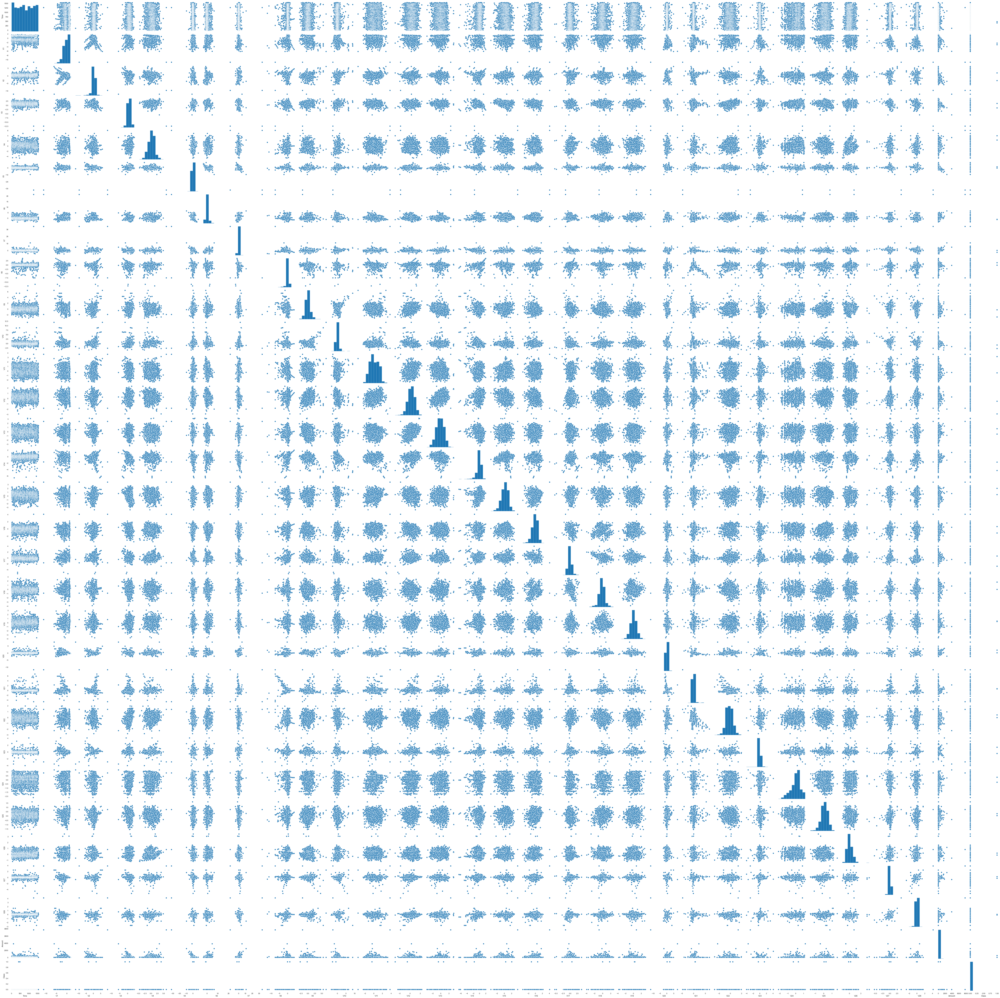

In [8]:
sns.pairplot(df[:2000])

### Verifying column V1, the dataset doc referenciated that this column is a PCA result using the columns v2 until v28.

###### Getting the mean and the standard deviation

In [29]:
v1_mean = np.mean(df.V1)
v1_std = np.std(df.V1)

###### At the next step, we gonna get the First Quantile, the Median and the Third quantile
    - We'll calculate the IQR value and the Boundaries (Lower Infer Fence and Lower Upper Fence)

In [30]:
q1_v1,median_v1,q3_v1 = np.quantile(df.V1,[0.25,0.5,0.75])

iqr_v1 = q3_v1 - q1_v1

minimum_v1 = q1_v1 - 1.5 * iqr_v1
maximum_v1 = q3_v1 + 1.5 * iqr_v1

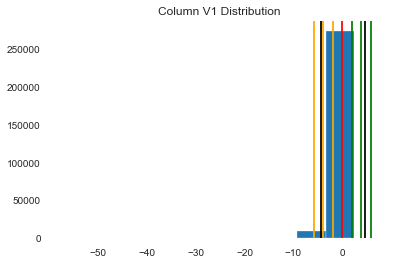

In [31]:
plt.hist((df.V1))
plt.axvline((v1_mean), color='red')
plt.axvline((v1_std) * 1, color='green')
plt.axvline((v1_std) * 2, color='green')
plt.axvline((v1_std) * 3, color='green')
plt.axvline((maximum_v1), color='black')

plt.axvline((v1_std) * -1, color='orange')
plt.axvline((v1_std) * -2, color='orange')
plt.axvline((v1_std) * -3, color='orange')
plt.axvline((minimum_v1), color='black')

plt.title("Column V1 Distribution")

plt.show()

In [32]:
q1,median,q3 = np.quantile(np.sqrt(df.V1),[0.25,0.5,0.75])

iqr = q3 - q1

minimum = q1 - 1.5 * iqr
maximum = q3 + 1.5 * iqr

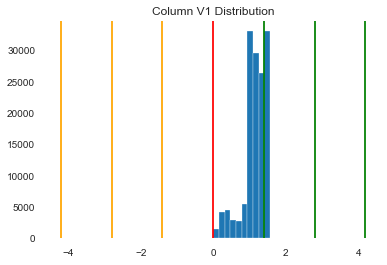

In [33]:
plt.hist(np.sqrt(df.V1))
plt.axvline(np.sqrt(v1_mean), color='red')
plt.axvline(np.sqrt(v1_std) * 1, color='green')
plt.axvline(np.sqrt(v1_std) * 2, color='green')
plt.axvline(np.sqrt(v1_std) * 3, color='green')
plt.axvline((maximum), color='black')



plt.axvline(np.sqrt(v1_std) * -1, color='orange')
plt.axvline(np.sqrt(v1_std) * -2, color='orange')
plt.axvline(np.sqrt(v1_std) * -3, color='orange')
plt.axvline((minimum), color='black')


plt.title("Column V1 Distribution")

plt.show()

### Applying 3sigma rule to get data that could be anomalous

In [34]:
outliers = df[ (df.V1 <= minimum_v1) | (df.V1 >= maximum_v1)   ]

#outliers_3sigma = [a for (a >= sigma_plus) in df.V1] 


In [35]:
len(outliers) / len(df)

0.024795738868777804

In [36]:
len(outliers)

7062

###### We can see that this method could generate many false posistives too, because sometimes the higher value in a column isn't a real anomaly if we look to the hole context, it is just an outlier in his own context.

In [37]:
len(outliers[outliers.Class == 1])

174

In [38]:
len(df[df.Class == 1])

492

## Scaling and Normalizing the feature Amount
    - The feature is the only that is not normalized

In [39]:
from sklearn.preprocessing import StandardScaler

std = StandardScaler()

amount = std.fit_transform(df.Amount.values.reshape(-1,1))

In [40]:
# from sklearn.preprocessing import Normalizer

# nm = Normalizer()

# amount = nm.fit_transform(amount)

In [41]:
amount_mean = np.mean(amount)
amount_std = np.std(amount)

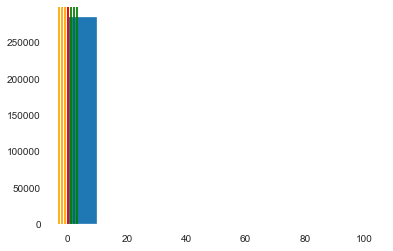

In [42]:
plt.hist((amount))
plt.axvline((amount_mean), color='red')
plt.axvline((amount_std * 1), color='green')
plt.axvline((amount_std * 2), color='green')
plt.axvline((amount_std * 3), color='green')
plt.axvline((amount_std * -1), color='orange')
plt.axvline((amount_std * -2), color='orange')
plt.axvline((amount_std * -3), color='orange')
plt.axvline((amount_mean), color='red')
plt.show()

C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in sqrt
  """Entry point for launching an IPython kernel.
C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


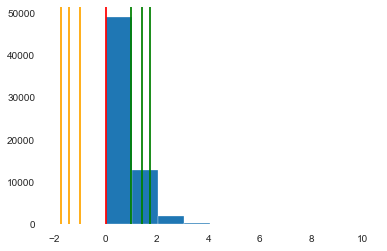

In [43]:
plt.hist(np.sqrt(amount))
plt.axvline(np.sqrt(amount_mean), color='red')
plt.axvline(np.sqrt(amount_std * 1), color='green')
plt.axvline(np.sqrt(amount_std * 2), color='green')
plt.axvline(np.sqrt(amount_std * 3), color='green')
plt.axvline(-np.sqrt(amount_std * 1), color='orange')
plt.axvline(-np.sqrt(amount_std * 2), color='orange')
plt.axvline(-np.sqrt(amount_std * 3), color='orange')
plt.show()

In [44]:
df['Norm_Amount'] = (amount)

In [48]:
mean = np.mean(df['Norm_Amount'])
std_amount = np.std(df['Norm_Amount'])

In [46]:
q1,median,q3 = np.quantile(df['Norm_Amount'],[0.25,0.50,0.75])

iqr = q3 - q1

minimum = q1 - 1.5 * iqr
maximum = q3 + 1.5 * iqr

C:\Users\filip\AppData\Roaming\Python\Python36\site-packages\pandas\core\series.py:856: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


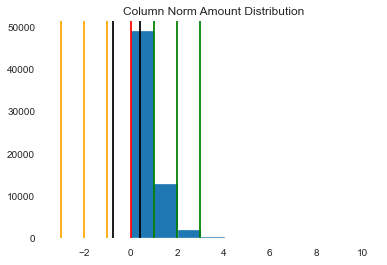

In [49]:
plt.hist(np.sqrt(df.Norm_Amount))
plt.axvline(np.sqrt(mean), color='red')
plt.axvline(np.sqrt(std_amount) * 1, color='green')
plt.axvline(np.sqrt(std_amount) * 2, color='green')
plt.axvline(np.sqrt(std_amount) * 3, color='green')
plt.axvline((maximum), color='black')



plt.axvline(np.sqrt(std_amount) * -1, color='orange')
plt.axvline(np.sqrt(std_amount) * -2, color='orange')
plt.axvline(np.sqrt(std_amount) * -3, color='orange')
plt.axvline((minimum), color='black')


plt.title("Column Norm Amount Distribution")

plt.show()

In [50]:
outliers = df[ (df['Norm_Amount'] <= minimum) | (df['Norm_Amount'] >= maximum)   ]

In [51]:
len(outliers[outliers.Class == 1])

91

### Z-SCORE

In [52]:
from scipy import stats

In [85]:
z = np.abs(stats.zscore(df['Norm_Amount'].values))
threshold = 3
p = np.where(z > threshold)
print(p)

(array([    51,     89,    140, ..., 284383, 284497, 284528], dtype=int64),)


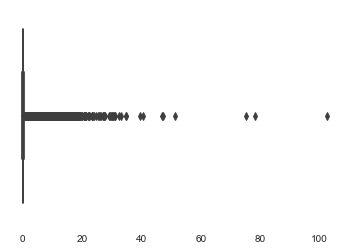

In [86]:
sns.boxplot(z)

In [88]:
anomalous = df[['Norm_Amount','Class']].iloc[p]

In [90]:
anomalous[anomalous['Class'] == 1]

,Norm_Amount,Class
6971,6.882027,1
10690,4.519998,1
81609,5.202351,1
89190,5.252727,1
95597,5.061179,1
176049,8.146182,1
199896,4.984216,1
203328,3.346240,1
233258,3.629944,1
249167,5.663610,1


In [91]:
len(anomalous[anomalous['Class'] == 1])

11

In [87]:
for i in p:
    print(df[['Norm_Amount','Class']].iloc[i])

        Norm_Amount  Class
51         5.255886      0
89         4.212665      0
140        3.323411      0
150        3.395736      0
164       14.951604      0
...             ...    ...
284249    40.425011      0
284290     3.233054      0
284383     4.100639      0
284497     5.582569      0
284528     3.245048      0

[4076 rows x 2 columns]


### As we saw in the last section is very hard find anomalies just looking by one measure each time, so we need something more sofisticated method to identify de variation in a tuple of data not more measure by mesaure, now we will look to all measures toguether, line by line.

### Using Isolation Forest to Detect Anomaly

In [27]:
from pyod.models.iforest import IsolationForest
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,balanced_accuracy_score, confusion_matrix, classification_report

In [28]:
X = df.drop(columns=['Class', 'Amount'])
y = df.Class

In [29]:
print("Proportion of Anomalous in the dataset : {:.4f} %".format( (len(df[df.Class == 1]) / len(df))*100 ))

Proportion of Anomalous in the dataset : 0.1727 %


In [30]:
print("Proportion of Normal in the dataset : {:.4f}%".format( (len(df[df.Class == 0]) / len(df))*100 ))

Proportion of Normal in the dataset : 99.8273%


In [31]:
X_train,X_test,y_train,y_test = train_test_split(X, y, train_size=0.35, random_state=0 )

C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [32]:
ifs = IsolationForest( n_estimators=100,
    max_samples='auto',
    contamination='legacy',
    max_features=1.0,
    bootstrap=False,
    n_jobs=-1,
    behaviour='old',
    random_state=None,
    verbose=1)

In [33]:
model = ifs.fit(X_train,y_train)

C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\ensemble\iforest.py:213: FutureWarning: default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.
  FutureWarning)
C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\ensemble\iforest.py:223: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   2 out of  12 | elapsed:    2.6s remaining:   13.6s
[Parallel(n_jobs=12)]: Done  12 out of  12 | elapsed:    2.8s finished


In [34]:
y_pred = model.predict(X_test)

C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\sklearn\ensemble\iforest.py:417: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


In [35]:
y_pred = [1 if x == -1 else 0 for x in y_pred]

#### Verifying the accuracy
    - Altough the accuracy is high, it dosn't represent the really, because we have an unbalanced dataset, so we need to 
    look on de recall value to could infer something

In [36]:
accuracy_score(y_test,y_pred)

0.9015962187711006

In [37]:
balanced_accuracy_score(y_test,y_pred)

0.8922697799322201

In [38]:
cm = confusion_matrix(y_test,y_pred)

In [39]:
cm

array([[166629,  18180],
       [    37,    279]], dtype=int64)

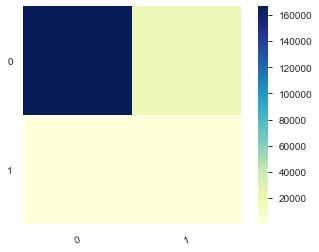

In [40]:
plt.imshow(cm, cmap='YlGnBu')
plt.colorbar()
plt.xticks(range(len(cm)),[0,1], rotation=20)
plt.yticks(range(len(cm)),[0,1])
plt.show()

In [41]:
print(classification_report(y_test,y_pred, target_names = ['Normal','Anomaly'] ) )

              precision    recall  f1-score   support

      Normal       1.00      0.90      0.95    184809
     Anomaly       0.02      0.88      0.03       316

   micro avg       0.90      0.90      0.90    185125
   macro avg       0.51      0.89      0.49    185125
weighted avg       1.00      0.90      0.95    185125



### Using Auto Encoder for Anomaly Detection

In [42]:
from pyod.models.auto_encoder import AutoEncoder

Using TensorFlow backend.


In [43]:
X.shape

(284807, 30)

In [44]:
rnn = AutoEncoder( hidden_neurons=[28,18,12,6,2,6,12,18,28],
                hidden_activation='relu',
                output_activation='sigmoid',                
                optimizer='adam',
                epochs=14,
                batch_size=32,
                dropout_rate=0.2,
                l2_regularizer=0.1,
                validation_size=0.1,
                preprocessing=True,
                verbose=1,
                random_state=None,
                contamination=0.1)

In [45]:
rnn.fit(X_train,y_train)

C:\Users\filip\AppData\Local\Continuum\anaconda3\envs\tf-gpu\lib\site-packages\pyod\models\base.py:349: UserWarning: y should not be presented in unsupervised learning.
  "y should not be presented in unsupervised learning.")


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 30)                930       
_________________________________________________________________
dropout_1 (Dropout)          (None, 30)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 30)                930       
_________________________________________________________________
dropout_2 (Dropout)          (None, 30)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 28)                868       
_________________________________________________________________
dropout_3 (Dropout)          (None, 28)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 18)                522       
__________

AutoEncoder(batch_size=32, contamination=0.1, dropout_rate=0.2, epochs=14,
      hidden_activation='relu',
      hidden_neurons=[28, 18, 12, 6, 2, 6, 12, 18, 28], l2_regularizer=0.1,
      loss=<function mean_squared_error at 0x0000020631480488>,
      optimizer='adam', output_activation='sigmoid', preprocessing=True,
      random_state=None, validation_size=0.1, verbose=1)

In [46]:
y_pred = rnn.predict(X_test)

In [47]:
print(classification_report(y_test,y_pred, target_names = ['Normal','Anomaly'] ) )

              precision    recall  f1-score   support

      Normal       1.00      0.90      0.95    184809
     Anomaly       0.02      0.90      0.03       316

   micro avg       0.90      0.90      0.90    185125
   macro avg       0.51      0.90      0.49    185125
weighted avg       1.00      0.90      0.95    185125



In [48]:
pred_all = rnn.predict(X)

In [49]:
X['PRED_ENCODER'] = pred_all

In [50]:
X.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Norm_Amount,PRED_ENCODER
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0.244964,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.342475,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,1.160686,1
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0.140534,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,-0.073403,0


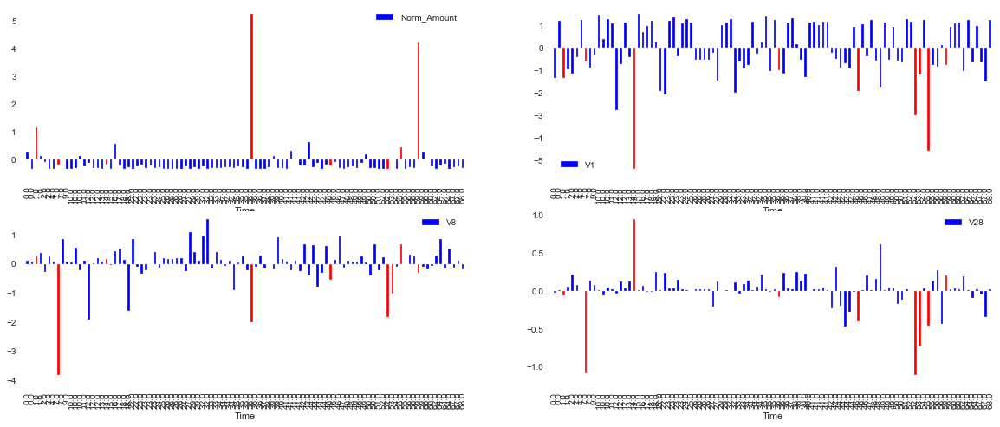

In [78]:
fig,ax = plt.subplots(2,2)
X[:100].plot(x='Time', y='Norm_Amount', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar',ax=ax[0][0])
X[:100].plot(x='Time', y='V1', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar',ax=ax[0][1])
X[:100].plot(x='Time', y='V8', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar',ax=ax[1][0])
X[:100].plot(x='Time', y='V28', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar',ax=ax[1][1])
plt.show()

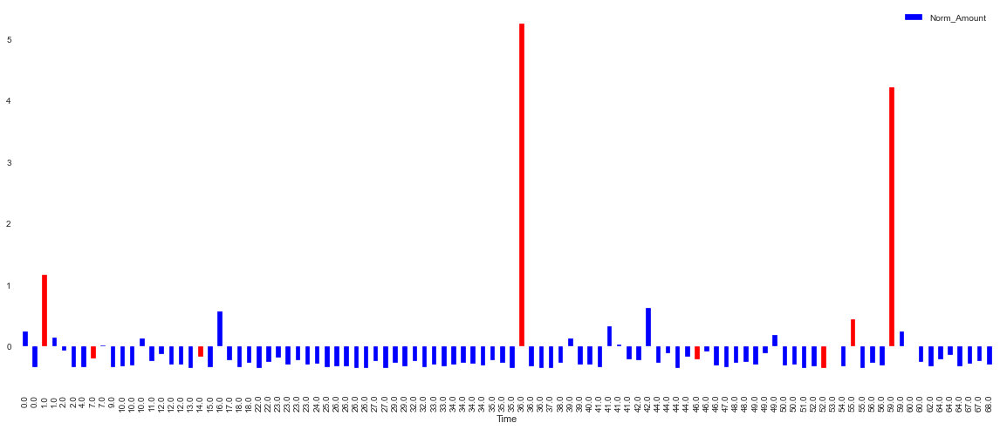

In [51]:
X[:100].plot(x='Time', y='Norm_Amount', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar')
plt.show()

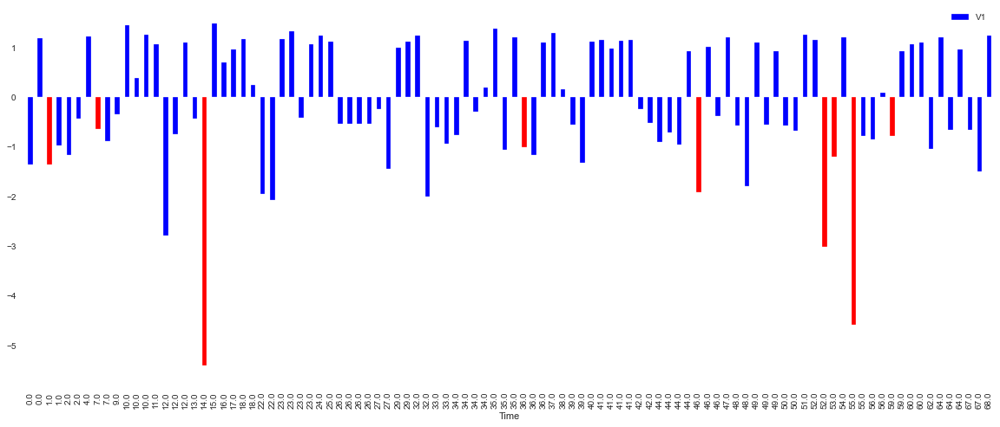

In [52]:
X[:100].plot(x='Time', y='V1', figsize=(20,8), color=np.where(X.PRED_ENCODER == 1,'red','blue'), kind='bar')
plt.show()